In [26]:
import os
import cv2
import numpy as np
import math
import requests
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.optimizers import Adam
from skimage.metrics import structural_similarity as ssim
from matplotlib import pyplot as plt


In [27]:
# PSNR function (Peak Signal-to-Noise Ratio)
def psnr(target, ref):
    target_data = target.astype(float)
    ref_data = ref.astype(float)

    diff = ref_data - target_data
    diff = diff.flatten('C')

    rmse = math.sqrt(np.mean(diff ** 2.))

    return 20 * math.log10(255. / rmse)

# MSE function (Mean Squared Error)
def mse(target, ref):
    err = np.sum((target.astype('float') - ref.astype('float')) ** 2)
    err /= float(target.shape[0] * target.shape[1])
    return err

# Compare Images function that returns PSNR, MSE, and SSIM
def compare_images(target, ref):
    psnr_value = psnr(target, ref)
    mse_value = mse(target, ref)
    
    # SSIM using smaller window size for smaller images
    ssim_value = ssim(target, ref, multichannel=True, win_size=3)  
    
    return psnr_value, mse_value, ssim_value


In [28]:
# SRCNN model definition
def model():
    SRCNN = Sequential()

    # Adding layers to the model
    SRCNN.add(Conv2D(filters=128, kernel_size=(9, 9), kernel_initializer='glorot_uniform',
                     activation='relu', padding='valid', use_bias=True, input_shape=(None, None, 1)))
    SRCNN.add(Conv2D(filters=64, kernel_size=(3, 3), kernel_initializer='glorot_uniform',
                     activation='relu', padding='same', use_bias=True))
    SRCNN.add(Conv2D(filters=1, kernel_size=(5, 5), kernel_initializer='glorot_uniform',
                     activation='linear', padding='valid', use_bias=True))

    # Define optimizer and compile the model
    adam = Adam(learning_rate=0.0003)
    SRCNN.compile(optimizer=adam, loss='mean_squared_error', metrics=['mean_squared_error'])
    
    return SRCNN


In [29]:
# Download model weights
def download_weights():
    weights_folder = 'weights'
    weights_url = "https://github.com/MarkPrecursor/SRCNN-keras/raw/master/3051crop_weight_200.h5"
    weights_path = os.path.join(weights_folder, "3051crop_weight_200.h5")

    if not os.path.exists(weights_folder):
        os.makedirs(weights_folder)

    if not os.path.exists(weights_path):
        response = requests.get(weights_url)
        if response.status_code == 200:
            with open(weights_path, 'wb') as f:
                f.write(response.content)
            print(f"Successfully downloaded the weights to {weights_path}")
        else:
            print(f"Failed to download the weights. Status code: {response.status_code}")

    return weights_path


In [30]:
# Load weights into the model
def load_model_weights():
    srcnn = model()  # Create the SRCNN model
    weights_path = download_weights()
    
    try:
        srcnn.load_weights(weights_path)  # Load the weights
        print("Weights loaded successfully!")
    except Exception as e:
        print(f"Error loading model weights: {e}")
        return None
    return srcnn


In [31]:
# Prepare images (resize and simulate degradation)
def prepare_images(path, factor):
    if not os.path.exists(path):
        print(f"The folder '{path}' does not exist!")
        return

    if not os.path.exists('images'):
        os.makedirs('images')

    for file in os.listdir(path):
        file_path = os.path.join(path, file)

        if os.path.isfile(file_path):
            img = cv2.imread(file_path)
            
            if img is None:
                print(f"Failed to load image: {file}")
                continue

            h, w, _ = img.shape
            new_height = h // factor
            new_width = w // factor

            # Simulate image degradation by resizing down and up
            img_resized = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_LINEAR)
            img_resized_up = cv2.resize(img_resized, (w, h), interpolation=cv2.INTER_LINEAR)

            output_path = os.path.join('images', file)
            cv2.imwrite(output_path, img_resized_up)

            print(f"Processed and saved {file} to 'images/'")
        else:
            print(f"Skipping non-file: {file}")


In [32]:
def predict(image_path, model):
    # Load the degraded image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)  # Convert to YCrCb color space
    y, cr, cb = cv2.split(image)  # Split into Y, Cr, and Cb channels
    
    # Prepare the Y channel for prediction
    y = np.expand_dims(y, axis=(0, -1))  # Add batch and channel dimensions
    y = y.astype(np.float32) / 255.0  # Normalize

    # Generate the super-resolved image
    pred = model.predict(y)  # Predict using the SRCNN model

    # Ensure pred is within valid pixel range
    pred = np.clip(pred, 0, 1) * 255.0  # Rescale to original range
    pred = pred.astype(np.uint8)

    # Resize the predicted Y channel to match the original image size
    pred_resized = cv2.resize(pred[0, :, :, 0], (y.shape[2], y.shape[1]), interpolation=cv2.INTER_CUBIC)

    # Replace the Y channel in the image with the predicted Y channel
    temp = cv2.merge([pred_resized, cr, cb])  # Merge the predicted Y with the original Cr and Cb

    # Convert the image back to BGR color space
    output = cv2.cvtColor(temp, cv2.COLOR_YCrCb2BGR)

    return output


In [33]:
# Test and compare images
def test_and_compare_images(srcnn):
    if not os.path.exists('images'):
        print("No images to process.")
        return

    for file in os.listdir('images/'):
        image_path = os.path.join('images/', file)

        # Generate super-resolved image
        output = predict(image_path, srcnn)

        if output is None:
            continue  # Skip if prediction failed

        # Load the reference (original) image
        ref = cv2.imread(os.path.join('source', file))

        if ref is None:
            print(f"Error reading reference image for file: {file}")
            continue

        # Calculate PSNR, MSE, SSIM
        psnr_val, mse_val, ssim_val = compare_images(output, ref)

        # Print the results
        print(f"Results for {file}:\nPSNR: {psnr_val}\nMSE: {mse_val}\nSSIM: {ssim_val}\n")

        # Save the super-resolved image
        cv2.imwrite(f'images/{file}_sr.png', output)

        # Display images side-by-side
        fig, axs = plt.subplots(1, 3, figsize=(20, 8))
        axs[0].imshow(cv2.cvtColor(ref, cv2.COLOR_BGR2RGB))
        axs[0].set_title('Original')
        axs[1].imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
        axs[1].set_title('Degraded')
        axs[2].imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
        axs[2].set_title('Super-Resolved')
        for ax in axs:
            ax.set_xticks([])
            ax.set_yticks([])
        plt.show()


Weights loaded successfully!
Processed and saved baboon.bmp to 'images/'
Processed and saved baby_GT.bmp to 'images/'
Processed and saved barbara.bmp to 'images/'
Processed and saved bird_GT.bmp to 'images/'
Processed and saved bridge.bmp to 'images/'
Processed and saved butterfly_GT.bmp to 'images/'
Processed and saved coastguard.bmp to 'images/'
Processed and saved comic.bmp to 'images/'
Processed and saved face.bmp to 'images/'
Processed and saved flowers.bmp to 'images/'
Processed and saved foreman.bmp to 'images/'
Processed and saved head_GT.bmp to 'images/'
Processed and saved lenna.bmp to 'images/'
Processed and saved man.bmp to 'images/'
Processed and saved monarch.bmp to 'images/'
Processed and saved pepper.bmp to 'images/'
Processed and saved ppt3.bmp to 'images/'
Processed and saved woman_GT.bmp to 'images/'
Processed and saved zebra.bmp to 'images/'
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Results for baboon.bmp:
PSNR: 17.2071146093744
MSE: 3710.9931666666666
SSIM: 0.58187835402

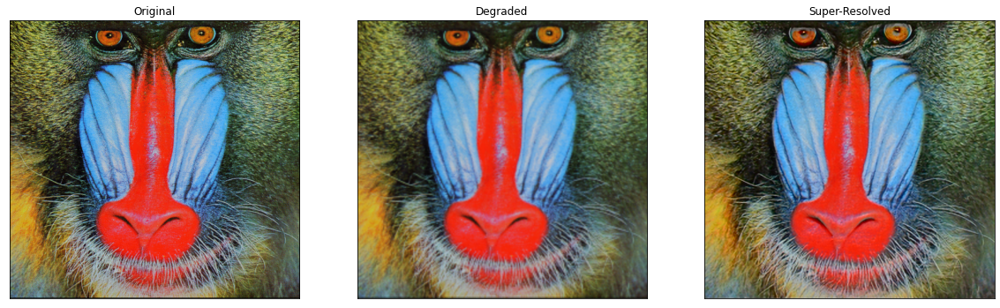

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step
Error reading reference image for file: baboon.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step
Results for baby_GT.bmp:
PSNR: 19.302456910774705
MSE: 2290.63516998291
SSIM: 0.8371068431829614



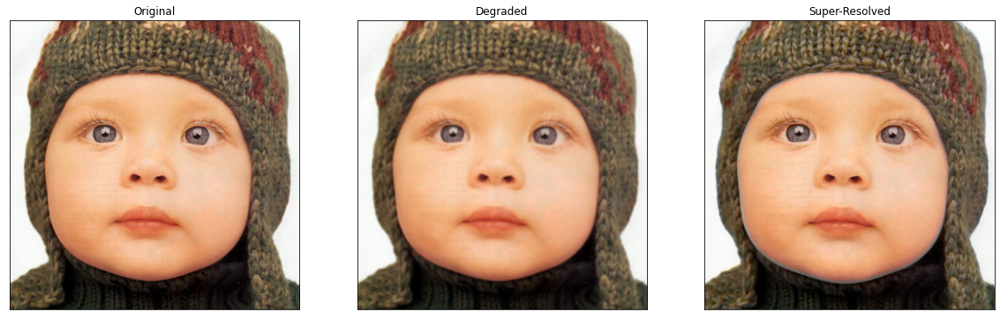

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 782ms/step
Error reading reference image for file: baby_GT.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Results for barbara.bmp:
PSNR: 17.897933447022254
MSE: 3165.251847029321
SSIM: 0.6586960395088256



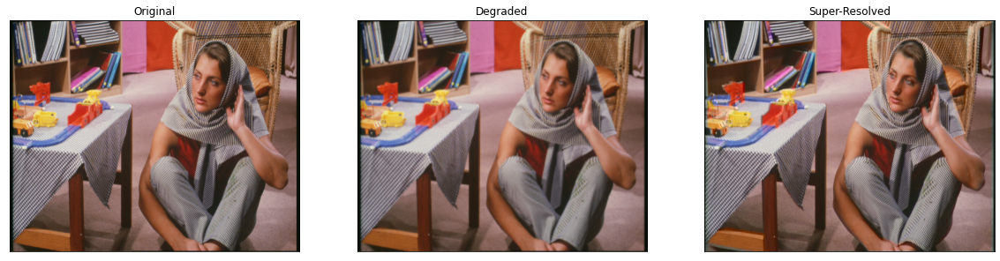

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
Error reading reference image for file: barbara.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step
Results for bird_GT.bmp:
PSNR: 19.180234425723974
MSE: 2356.0156611689813
SSIM: 0.866904484066926



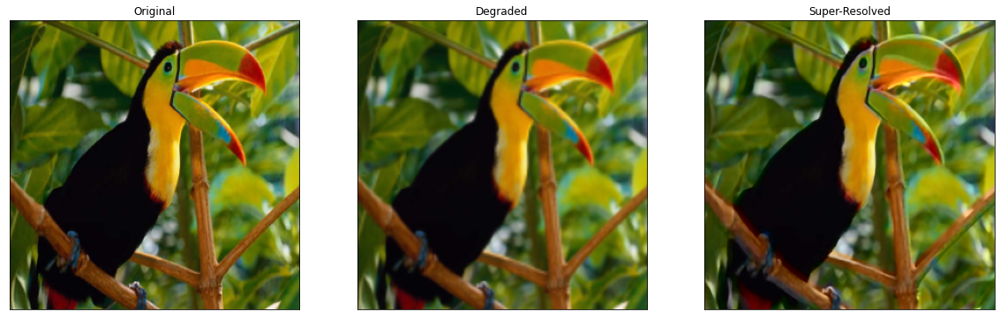

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
Error reading reference image for file: bird_GT.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 755ms/step
Results for bridge.bmp:
PSNR: 17.574310755494036
MSE: 3410.126895904541
SSIM: 0.29534304625418956



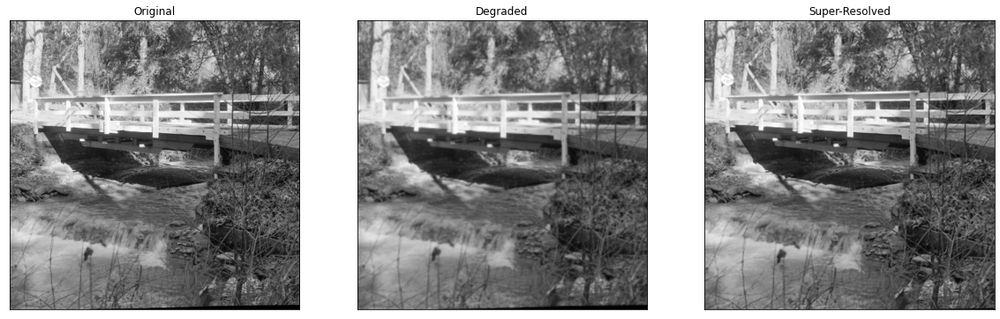

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 790ms/step
Error reading reference image for file: bridge.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
Results for butterfly_GT.bmp:
PSNR: 12.055216304029164
MSE: 12152.90170288086
SSIM: 0.6875329403750476



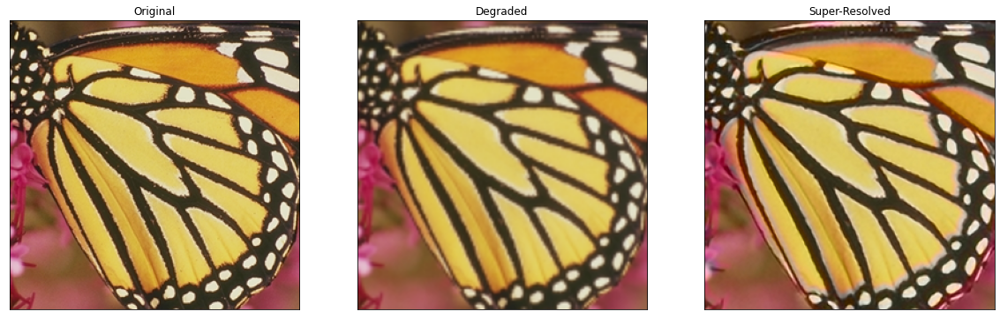

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step
Error reading reference image for file: butterfly_GT.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
Results for coastguard.bmp:
PSNR: 19.228393384802985
MSE: 2330.0341007733587
SSIM: 0.40381677630554624



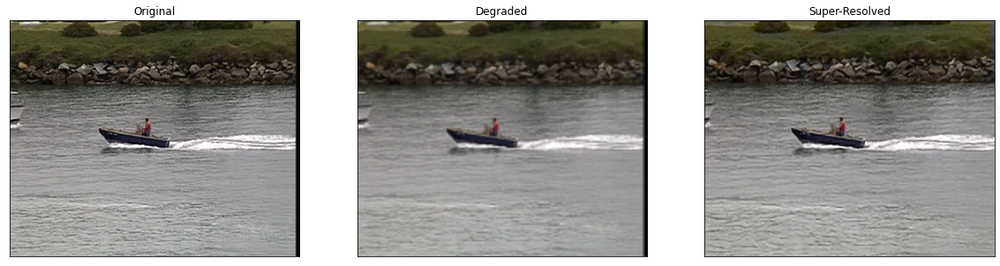

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step
Error reading reference image for file: coastguard.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step
Results for comic.bmp:
PSNR: 13.873921326433173
MSE: 7994.834592797784
SSIM: 0.4860708972689933



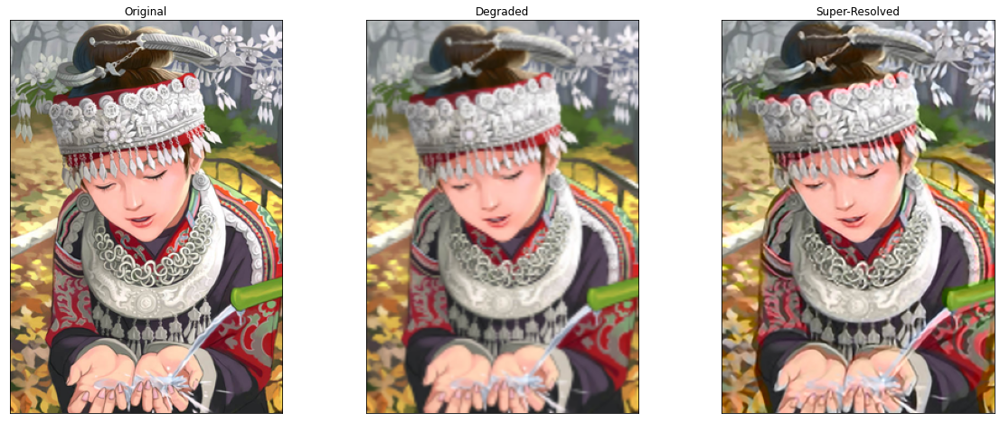

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step
Error reading reference image for file: comic.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step
Results for face.bmp:
PSNR: 22.744881777417604
MSE: 1036.84404536862
SSIM: 0.7934742728250825



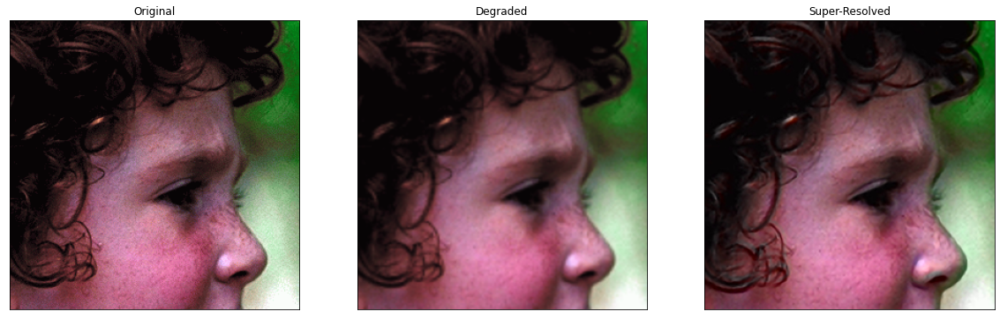

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
Error reading reference image for file: face.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step
Results for flowers.bmp:
PSNR: 17.783127286018715
MSE: 3250.0413535911603
SSIM: 0.7444634400579615



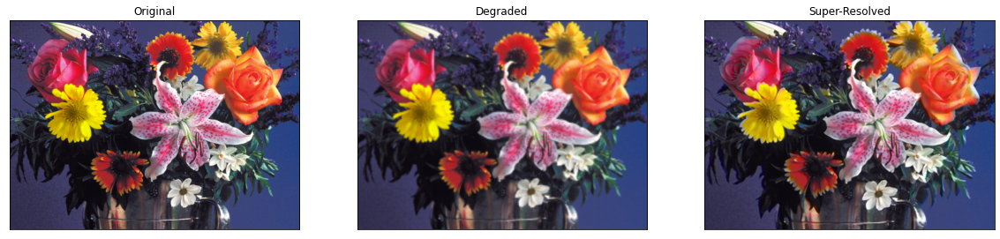

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step
Error reading reference image for file: flowers.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
Results for foreman.bmp:
PSNR: 17.299088106780943
MSE: 3633.2292751736113
SSIM: 0.8225138607092405



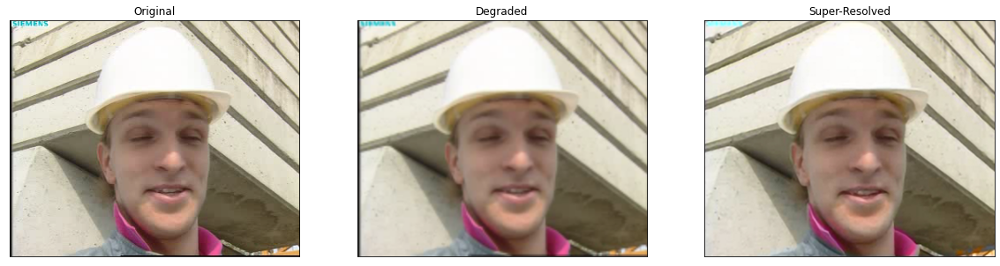

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step
Error reading reference image for file: foreman.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step
Results for head_GT.bmp:
PSNR: 22.834719909216048
MSE: 1015.6162117346939
SSIM: 0.7948653498901469



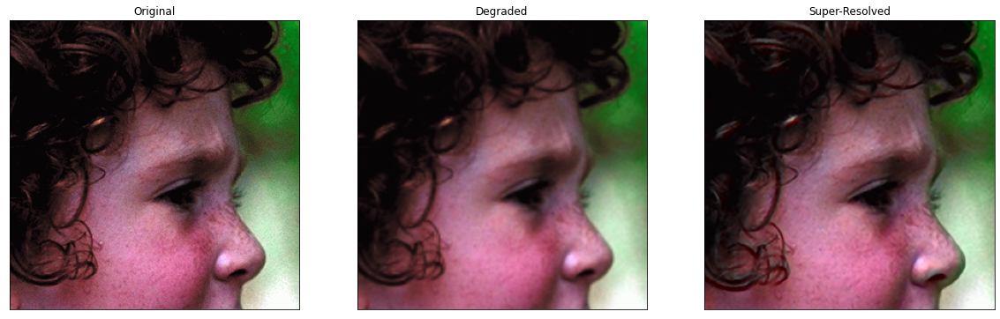

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
Error reading reference image for file: head_GT.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step
Results for lenna.bmp:
PSNR: 20.39476266685545
MSE: 1781.2519340515137
SSIM: 0.9319937470089737



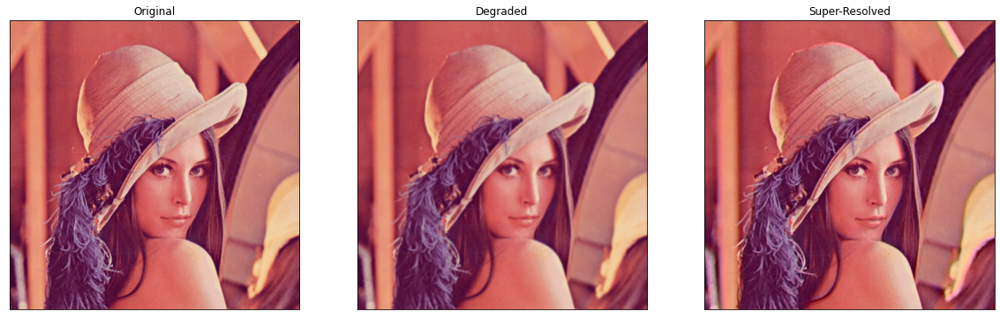

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 710ms/step
Error reading reference image for file: lenna.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 728ms/step
Results for man.bmp:
PSNR: 17.766160248478023
MSE: 3262.7634658813477
SSIM: 0.41413413864339427



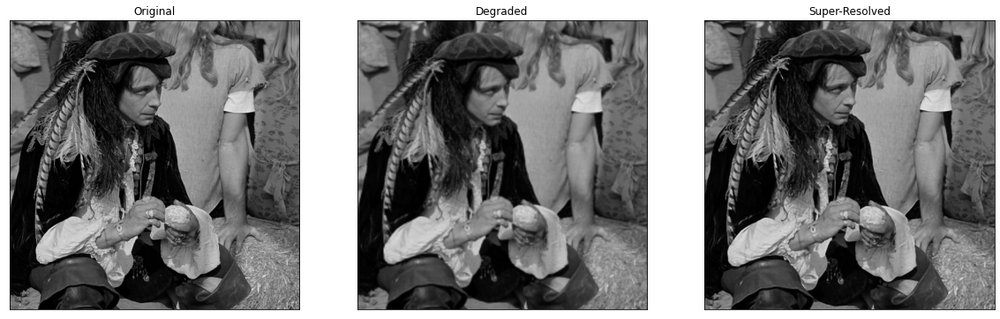

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 758ms/step
Error reading reference image for file: man.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Results for monarch.bmp:
PSNR: 19.256983124914818
MSE: 2314.74579111735
SSIM: 0.9143242306033282



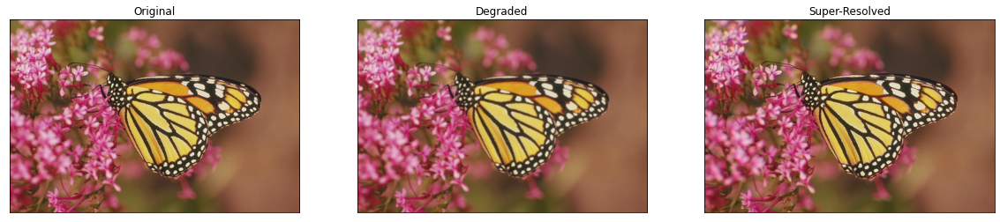

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Error reading reference image for file: monarch.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 794ms/step
Results for pepper.bmp:
PSNR: 19.310067464497706
MSE: 2286.6245880126953
SSIM: 0.9249454819410733



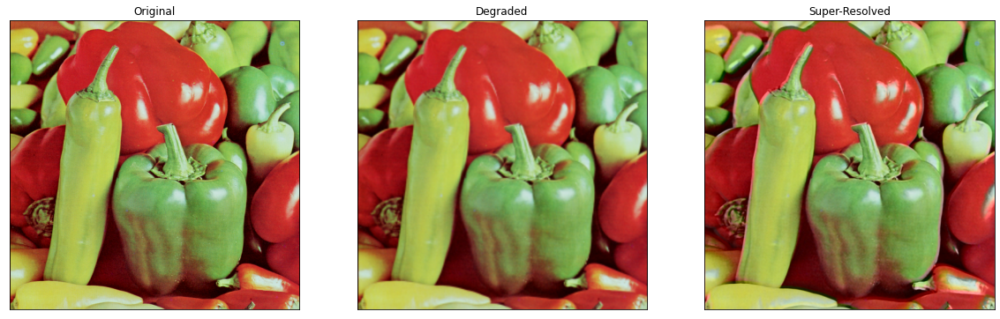

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 720ms/step
Error reading reference image for file: pepper.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step
Results for ppt3.bmp:
PSNR: 14.178988511944395
MSE: 7452.513379478077
SSIM: 0.7793838144380427



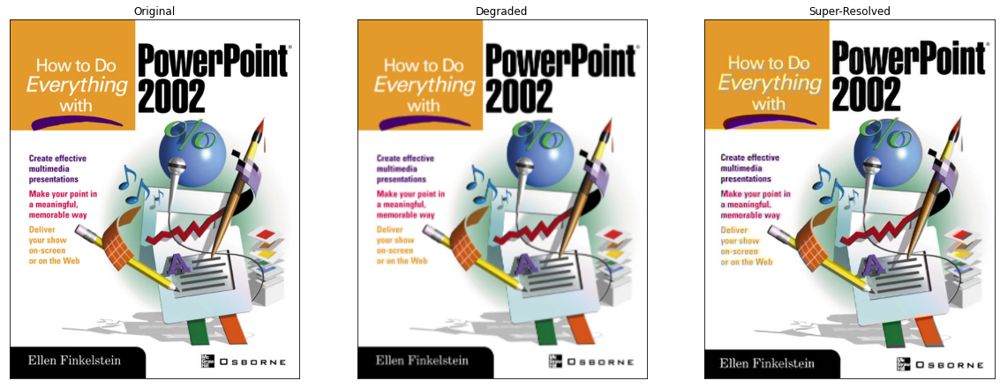

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
Error reading reference image for file: ppt3.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
Results for woman_GT.bmp:
PSNR: 15.650309098000271
MSE: 5310.931571297429
SSIM: 0.8075663802205258



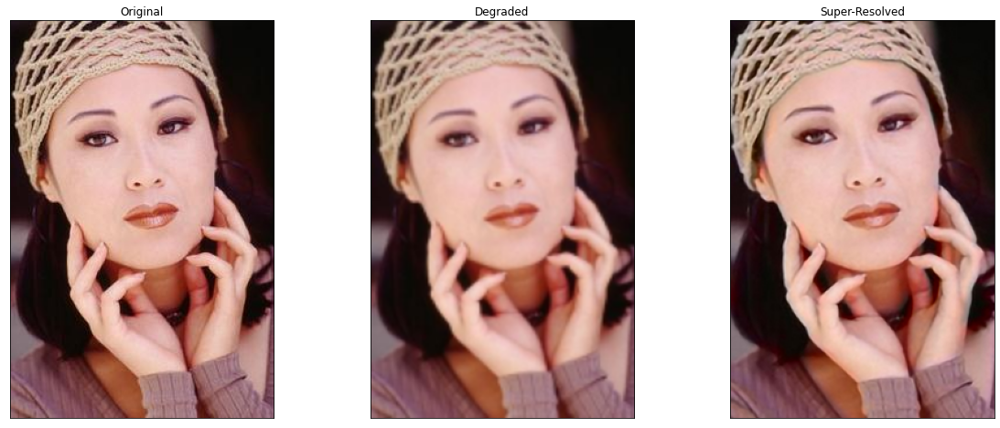

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step
Error reading reference image for file: woman_GT.bmp_sr.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 729ms/step
Results for zebra.bmp:
PSNR: 15.894082549146177
MSE: 5021.036294440613
SSIM: 0.7672308921730446



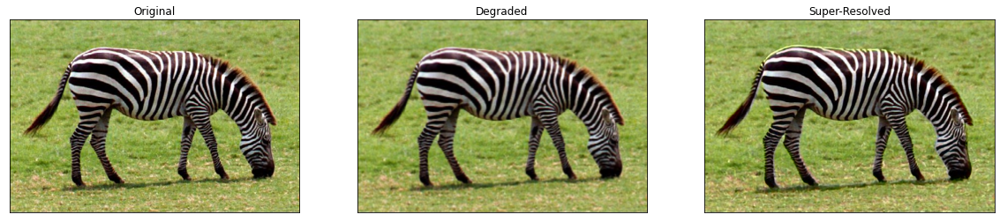

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step
Error reading reference image for file: zebra.bmp_sr.png


In [35]:
# Main workflow
def main():
    # Load the model and weights
    srcnn = load_model_weights()

    if srcnn is None:
        print("Model failed to load. Exiting.")
        return

    # Prepare images (simulate degradation)
    prepare_images('source/', 2)

    # Test and compare the images
    test_and_compare_images(srcnn)

# Execute the main workflow
main()
